# Import packages and set seed for reproducibility

In [1]:
import sys
!conda install --yes --prefix {sys.prefix} albumentations

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 22.9.0
  latest version: 22.11.1

Please update conda by running

    $ conda update -n base -c conda-forge conda



# All requested packages already installed.

Retrieving notices: ...working... done


In [2]:
import os
import sys
import json
import time
import random

import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import normalize

import matplotlib.pyplot as plt
import matplotlib.patheffects as pe
import seaborn as sn

from tqdm import tqdm
from tqdm.contrib.concurrent import process_map

import cv2

import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
from torch.nn import functional as F
from torch.utils.data import Dataset, DataLoader

import albumentations as album

/opt/conda/lib/python3.7/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: /opt/conda/lib/python3.7/site-packages/torchvision/image.so: undefined symbol: _ZN2at4_ops19empty_memory_format4callEN3c108ArrayRefIlEENS2_8optionalINS2_10ScalarTypeEEENS5_INS2_6LayoutEEENS5_INS2_6DeviceEEENS5_IbEENS5_INS2_12MemoryFormatEEE
  warn(f"Failed to load image Python extension: {e}")


In [3]:
def set_seed(seed, use_gpu = True):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if use_gpu:
        print("CUDA is available")
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

SEED = 12345
USE_SEED = True

if USE_SEED:
    set_seed(SEED, torch.cuda.is_available())

CUDA is available


# Use metadata to get image and mask paths

In [4]:
DATA_PATH = "./data"

In [5]:
# read files

In [6]:
train_metadata_df = pd.read_csv(os.path.join(DATA_PATH, "train_metadata_patches.csv"))
print(train_metadata_df.shape)

train_metadata_df.head()

(229836, 3)


,image_id,sat_image_path,mask_path
0,111335,train_patches/111335_sat_125_0_0.jpg,train_patches/111335_mask_125_0_0.png
1,111335,train_patches/111335_sat_125_0_224.jpg,train_patches/111335_mask_125_0_224.png
2,111335,train_patches/111335_sat_125_0_448.jpg,train_patches/111335_mask_125_0_448.png
3,111335,train_patches/111335_sat_125_0_672.jpg,train_patches/111335_mask_125_0_672.png
4,111335,train_patches/111335_sat_125_0_896.jpg,train_patches/111335_mask_125_0_896.png


In [7]:
valid_metadata_df = pd.read_csv(os.path.join(DATA_PATH, "valid_metadata_patches.csv"))
print(valid_metadata_df.shape)

valid_metadata_df.head()

(8000, 3)


,image_id,sat_image_path,mask_path
0,273002,valid_patches/273002_sat_100_0_0.jpg,valid_patches/273002_mask_100_0_0.png
1,273002,valid_patches/273002_sat_100_0_224.jpg,valid_patches/273002_mask_100_0_224.png
2,273002,valid_patches/273002_sat_100_0_448.jpg,valid_patches/273002_mask_100_0_448.png
3,273002,valid_patches/273002_sat_100_0_672.jpg,valid_patches/273002_mask_100_0_672.png
4,273002,valid_patches/273002_sat_100_0_896.jpg,valid_patches/273002_mask_100_0_896.png


In [8]:
test_metadata_df = pd.read_csv(os.path.join(DATA_PATH, "test_metadata_patches.csv"))
print(test_metadata_df.shape)

test_metadata_df.head()

(8100, 3)


,image_id,sat_image_path,mask_path
0,24813,test_patches/24813_sat_100_0_0.jpg,test_patches/24813_mask_100_0_0.png
1,24813,test_patches/24813_sat_100_0_224.jpg,test_patches/24813_mask_100_0_224.png
2,24813,test_patches/24813_sat_100_0_448.jpg,test_patches/24813_mask_100_0_448.png
3,24813,test_patches/24813_sat_100_0_672.jpg,test_patches/24813_mask_100_0_672.png
4,24813,test_patches/24813_sat_100_0_896.jpg,test_patches/24813_mask_100_0_896.png


In [9]:
# change paths

In [10]:
train_metadata_df["sat_image_path"] = train_metadata_df["sat_image_path"].apply(lambda img_pth: os.path.join(DATA_PATH, img_pth))
train_metadata_df["mask_path"] = train_metadata_df["mask_path"].apply(lambda mask_pth: os.path.join(DATA_PATH, mask_pth))

train_metadata_df.head()

,image_id,sat_image_path,mask_path
0,111335,./data/train_patches/111335_sat_125_0_0.jpg,./data/train_patches/111335_mask_125_0_0.png
1,111335,./data/train_patches/111335_sat_125_0_224.jpg,./data/train_patches/111335_mask_125_0_224.png
2,111335,./data/train_patches/111335_sat_125_0_448.jpg,./data/train_patches/111335_mask_125_0_448.png
3,111335,./data/train_patches/111335_sat_125_0_672.jpg,./data/train_patches/111335_mask_125_0_672.png
4,111335,./data/train_patches/111335_sat_125_0_896.jpg,./data/train_patches/111335_mask_125_0_896.png


In [11]:
valid_metadata_df["sat_image_path"] = valid_metadata_df["sat_image_path"].apply(lambda img_pth: os.path.join(DATA_PATH, img_pth))
valid_metadata_df["mask_path"] = valid_metadata_df["mask_path"].apply(lambda mask_pth: os.path.join(DATA_PATH, mask_pth))

valid_metadata_df.head()

,image_id,sat_image_path,mask_path
0,273002,./data/valid_patches/273002_sat_100_0_0.jpg,./data/valid_patches/273002_mask_100_0_0.png
1,273002,./data/valid_patches/273002_sat_100_0_224.jpg,./data/valid_patches/273002_mask_100_0_224.png
2,273002,./data/valid_patches/273002_sat_100_0_448.jpg,./data/valid_patches/273002_mask_100_0_448.png
3,273002,./data/valid_patches/273002_sat_100_0_672.jpg,./data/valid_patches/273002_mask_100_0_672.png
4,273002,./data/valid_patches/273002_sat_100_0_896.jpg,./data/valid_patches/273002_mask_100_0_896.png


In [12]:
test_metadata_df["sat_image_path"] = test_metadata_df["sat_image_path"].apply(lambda img_pth: os.path.join(DATA_PATH, img_pth))
test_metadata_df["mask_path"] = test_metadata_df["mask_path"].apply(lambda mask_pth: os.path.join(DATA_PATH, mask_pth))

test_metadata_df.head()

,image_id,sat_image_path,mask_path
0,24813,./data/test_patches/24813_sat_100_0_0.jpg,./data/test_patches/24813_mask_100_0_0.png
1,24813,./data/test_patches/24813_sat_100_0_224.jpg,./data/test_patches/24813_mask_100_0_224.png
2,24813,./data/test_patches/24813_sat_100_0_448.jpg,./data/test_patches/24813_mask_100_0_448.png
3,24813,./data/test_patches/24813_sat_100_0_672.jpg,./data/test_patches/24813_mask_100_0_672.png
4,24813,./data/test_patches/24813_sat_100_0_896.jpg,./data/test_patches/24813_mask_100_0_896.png


# Get class names and RGB values

In [13]:
class_dict = pd.read_csv(os.path.join(DATA_PATH, "class_dict.csv"))
class_dict

,name,r,g,b
0,urban_land,0,255,255
1,agriculture_land,255,255,0
2,rangeland,255,0,255
3,forest_land,0,255,0
4,water,0,0,255
5,barren_land,255,255,255
6,unknown,0,0,0


In [14]:
# list of class names
class_names = class_dict["name"].tolist()
# list of RGB values for each class
class_rgb_values = class_dict[["r", "g", "b"]].values.tolist()

In [15]:
format_spec = "{:<20} {:<20}"

print(format_spec.format("class name:", "class RGB values:"), "\n")

for i in range(len(class_names)):
    print(format_spec.format(str(class_names[i]), str(class_rgb_values[i])))

class name:          class RGB values:    

urban_land           [0, 255, 255]       
agriculture_land     [255, 255, 0]       
rangeland            [255, 0, 255]       
forest_land          [0, 255, 0]         
water                [0, 0, 255]         
barren_land          [255, 255, 255]     
unknown              [0, 0, 0]           


# Shuffle data and select train, valid, and test set sizes

In [16]:
train_metadata_df_shuffled = train_metadata_df.sample(frac = 1, random_state = 0).reset_index(drop=True)
train_df = train_metadata_df_shuffled.iloc[:60000]
print("train:", len(train_df))

train: 60000


In [17]:
valid_metadata_df_shuffled = valid_metadata_df.sample(frac = 1, random_state = 0).reset_index(drop=True)
valid_df = valid_metadata_df_shuffled.iloc[:8000]
print("valid:", len(valid_df))

valid: 8000


In [18]:
test_metadata_df_shuffled = test_metadata_df.sample(frac = 1, random_state = 0).reset_index(drop=True)
test_df = test_metadata_df_shuffled.iloc[:8000]
print("test:", len(test_df))

test: 8000


# Get size of an image and a mask 

In [19]:
# get image and mask paths of an image
idx = 0
image_path = train_df["sat_image_path"][idx]
mask_path = train_df["mask_path"][idx]

# read image and mask into a numpy array and convert from BGR ot RGB
image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
mask = cv2.cvtColor(cv2.imread(mask_path), cv2.COLOR_BGR2RGB)


def get_size(image, mask):

    format_spec = "{:<10} {:<26} {:<18} {:<16} {:<14}"

    image_size = sys.getsizeof(image)/10**6
    mask_size = sys.getsizeof(mask)/10**6

    if torch.is_tensor(image) and torch.is_tensor(mask):
        image_size = sys.getsizeof(image.storage())/10**6
        mask_size = sys.getsizeof(mask.storage())/10**6

    print(format_spec.format("name:", "object type:", "shape:", "data type:", "size [Mb]:"), "\n")
    print(format_spec.format("image", str(type(image)), str(list(image.shape)), str(image.dtype), str(round(image_size, 2))))
    print(format_spec.format("mask", str(type(mask)), str(list(mask.shape)), str(mask.dtype), str(round(mask_size, 2))))

get_size(image, mask)

name:      object type:               shape:             data type:       size [Mb]:     

image      <class 'numpy.ndarray'>    [224, 224, 3]      uint8            0.15          
mask       <class 'numpy.ndarray'>    [224, 224, 3]      uint8            0.15          


# Visualize images and masks

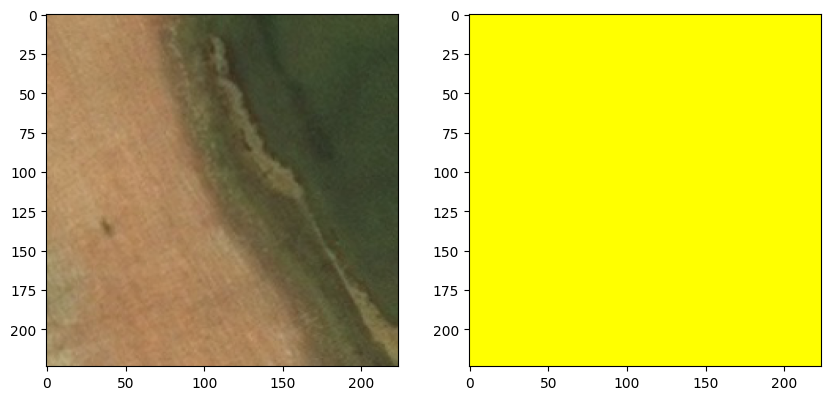

In [20]:
# get image and mask paths of an image
idx = 0
image_path = train_df["sat_image_path"][idx]
mask_path = train_df["mask_path"][idx]

# read image and mask into a numpy array and convert from BGR ot RGB
image = cv2.imread(image_path)
mask = cv2.imread(mask_path)

# plot image
fig = plt.subplots(figsize = (10,5))
plt.subplot(1,2,1), plt.imshow(image)
plt.subplot(1,2,2), plt.imshow(mask)
plt.show()

# Define functions for different encodings (one-hot <> rgb <> dense)

In [21]:
def rgb_to_one_hot_econding(mask_rgb, class_rgb_values):

    if mask_rgb.shape[2] != 3:
        raise ValueError("The number of channels must be 3")

    mask_one_hot = np.zeros((mask_rgb.shape[0], mask_rgb.shape[1], len(class_rgb_values)), dtype = "uint8")
    for i, rgb in enumerate(class_rgb_values):
        # np.equal(x, y): return (x == y) element-wise (the smaller array is broadcast to the larger one)
        # np.all(z): test whether all array elements along a given axis evaluate to True
        # numpy automatically converts bool to uint8
        mask_one_hot[:,:,i] = np.all(np.equal(mask_rgb, rgb), axis = -1)

    return mask_one_hot

In [22]:
def rgb_to_dense_encoding(mask_rgb, class_rgb_values):

    if mask_rgb.shape[2] != 3:
        raise ValueError("The number of channels must be 3")

    mask_dense = np.zeros((mask_rgb.shape[0], mask_rgb.shape[1]), dtype = "uint8")
    for i, rgb in enumerate(class_rgb_values):
        # np.equal(x, y): return (x == y) element-wise (the smaller array is broadcast to the larger one)
        # np.all(z): test whether all array elements along a given axis evaluate to True
        mask_dense[np.all(np.equal(mask_rgb, rgb), axis = -1)] = i

    return mask_dense

In [23]:
def dense_to_rgb_encoding(mask_dense, class_rgb_values):

    if len(mask_dense.shape) != 2:
        raise ValueError("The number of channels must be 1")

    mask_rgb = np.zeros((mask_dense.shape[0], mask_dense.shape[1], 3), dtype = "uint8")
    for i, rgb in enumerate(class_rgb_values):
        mask_rgb[mask_dense == i,:] = rgb

    return mask_rgb

In [24]:
def one_hot_to_rgb_encoding(mask_one_hot, class_rgb_values):

    if mask_one_hot.shape[2] != len(class_rgb_values):
        raise ValueError("The number of channels must be " + str(len(class_rgb_values)))

    mask_dense = np.argmax(mask_one_hot, axis = -1)
    mask_rgb = dense_to_rgb_encoding(mask_dense, class_rgb_values)

    return mask_rgb

# Class distributions and weights (median frequency balancing)

In [25]:
FREQ = False

In [26]:
def task_pixels(mask_path):

    mask = cv2.imread(mask_path)
    mask = rgb_to_dense_encoding(mask, class_rgb_values)

    # compute number of pixels of each class present in mask
    unique, counts = np.unique(mask, return_counts = True)
    return (unique, counts)

if FREQ:

    sparse_pixels = process_map(task_pixels, train_df["mask_path"].tolist(), max_workers = os.cpu_count(), chunksize = 1)

    pixels = np.zeros((len(sparse_pixels), 7))

    for i in range(len(sparse_pixels)):
        pixels[i, sparse_pixels[i][0]] = sparse_pixels[i][1]

In [27]:
"""
freq[c]: total number of pixels of class c (over all images)
         divided by the total number of pixels of images where c is present
"""

#freq = pixels.sum(axis = 0)/(np.count_nonzero(pixels, axis = 0)*224**2)
freq = np.array([0.3003414, 0.83421474, 0.39423746, 0.80435602, 0.36748701, 0.59869351, 0.1401496])

# median frequency balancing
class_weight = np.median(freq)/freq

In [28]:
"""
distr[c]: total number of pixels of class c (over all images)
          divided by the total number of pixels of all images
"""

#distr = pixels.sum(axis = 0)/(pixels.shape[0]*224**2)
distr = np.array([1.15481267e-01, 5.75441327e-01, 8.09369496e-02, 1.13052238e-01, 3.47703955e-02, 7.97759108e-02, 5.41911804e-04])
assert (abs(distr.sum() - 1) < 0.001)

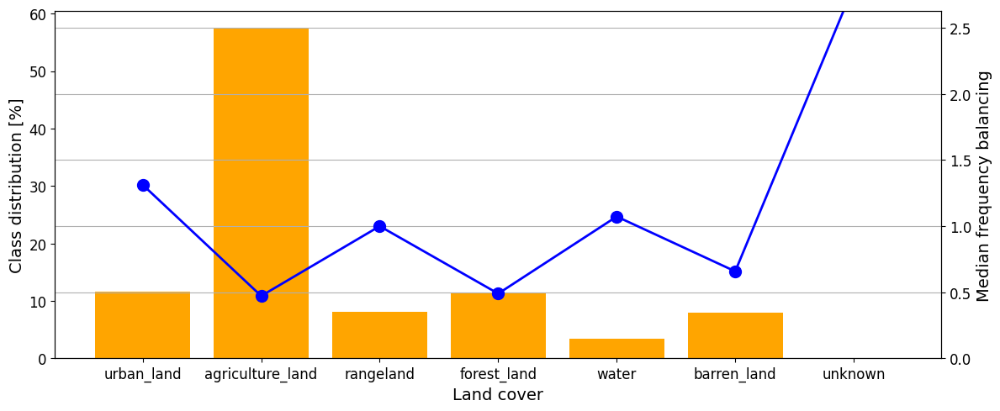

In [29]:
fig, axes1 = plt.subplots(figsize = (12,5))

# class distribution
axes1.bar(class_names, distr*100, color = "orange", alpha = 1)
axes1.xaxis.set_tick_params(labelsize = 12)
axes1.yaxis.set_tick_params(labelsize = 12)
axes1.set_xlabel("Land cover", fontsize = 14)
axes1.set_ylabel("Class distribution [%]", fontsize = 14)

# median frequency balancing
axes2 = axes1.twinx()
axes2.plot(class_names, class_weight, linestyle = "-", linewidth = 2, marker = "o", markersize = 10, color = "blue")
axes2.set_ylim(bottom = 0, top = max(class_weight[:-1])*2)
axes2.xaxis.set_tick_params(labelsize = 12)
axes2.yaxis.set_tick_params(labelsize = 12)
axes2.set_ylabel("Median frequency balancing", fontsize = 14)

plt.grid()
plt.tight_layout()
plt.show()

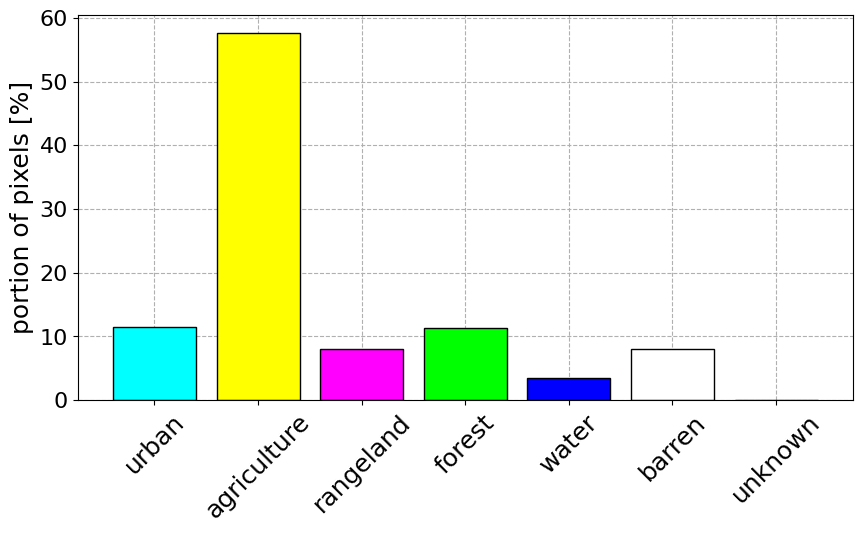

In [79]:
fig = plt.subplots(figsize = (10,5))

plt.bar([s.split("_")[0] for s in class_names], distr*100,
        color = np.array(class_rgb_values)/255,
        path_effects = ([pe.Stroke(linewidth = 1, foreground = "black")]),
        zorder = 2)

plt.grid(ls = "--", zorder = 1)

plt.ylabel("portion of pixels [%]", fontsize = 18)
plt.xticks(fontsize = 18, rotation = 45)
plt.yticks(fontsize = 16)

plt.savefig("./images/portion_of_pixels.pdf", dpi = 1200, bbox_inches = "tight")

# Data normalization


In [31]:
NORM = False

In [32]:
def task_mean(image_path):
    # numpy array (H,W,C)
    image = cv2.imread(image_path)
    # compute mean for each channel
    mean = np.sum(image, axis = (0,1))/(image.shape[0]**2)
    return mean

if NORM:
    train_means = process_map(task_mean, train_df["sat_image_path"].tolist(), max_workers = os.cpu_count(), chunksize = 1)

In [33]:
#train_mean = np.array(train_means).mean(axis = 0)
train_mean = np.array([103.63260898, 96.27071456, 71.42765577])
print(train_mean)

[103.63260898  96.27071456  71.42765577]


In [34]:
def task_var(image_path):
    # numpy array (H,W,C)
    image = cv2.imread(image_path)
    # compute unbiased variance for each channel using global mean
    var = np.sum((image - train_mean)**2, axis = (0,1))/(image.shape[0]**2 - 1)
    return var

if NORM:
    train_vars = process_map(task_var, train_df["sat_image_path"].tolist(), max_workers = os.cpu_count(), chunksize = 1)

In [35]:
#train_var = np.array(train_vars).mean(axis = 0)
#train_std = np.sqrt(train_var)
train_std = np.array([37.05739852, 28.75222502, 26.37861939])
print(train_std)

[37.05739852 28.75222502 26.37861939]


# Define transformations for pre-processing and data augmentation

In [36]:
train_transform = album.Compose([
    # reduce image size
    #album.RandomCrop(height = 224, width = 224),
    # apply dihedral group D4
    album.RandomRotate90(p=1), # randomly rotates by 0, 90, 180, 270 degrees
    album.HorizontalFlip(p=0.5),
    album.VerticalFlip(p=0.5),
    album.Transpose(p=0.5),
    # change brightness, contrast, and saturation
    album.ColorJitter(p=0.5),
    # normalize
    album.Normalize(mean = train_mean/255, std = train_std/255)
    #album.Lambda(image=preprocessing_fn)
])

In [37]:
valid_transform = album.Compose([
    # reduce image size
    #album.RandomCrop(height = 224, width = 224),
    # normalize
    album.Normalize(mean = train_mean/255, std = train_std/255)
    #album.Lambda(image=preprocessing_fn)
])

In [38]:
test_transform = album.Compose([
    # reduce image size
    #album.RandomCrop(height = 224, width = 224),
    # normalize
    album.Normalize(mean = train_mean/255, std = train_std/255)
    #album.Lambda(image=preprocessing_fn)
])

# Create a custom dataset class

In [39]:
class DeepGlobeLandCover(Dataset):

    def __init__(self, df, class_rgb_values = None, transform = None):

        # store image and mask paths
        self.image_paths = df["sat_image_path"].tolist()
        self.mask_paths = df["mask_path"].tolist()

        self.class_rgb_values = class_rgb_values
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, i):
        
        # read image and mask into a numpy array (they are already stored as BGR)
        image = cv2.imread(self.image_paths[i])
        mask = cv2.imread(self.mask_paths[i])

        # apply transformations
        if self.transform:
            sample = self.transform(image=image, mask=mask)
            image, mask = sample["image"], sample["mask"]

        # apply dense encoding
        mask = rgb_to_dense_encoding(mask, self.class_rgb_values)

        # transform from numpy array (H,W,C) to torch tensor (C,H,W)
        image = torch.from_numpy(image).permute(2, 0, 1)
        mask = torch.from_numpy(mask)#.long()

        return image, mask

# Create train, valid and test datasets

In [40]:
# get size of an image and a mask from the train dataset (without transformations)
idx = 0
get_size(*DeepGlobeLandCover(train_df, class_rgb_values)[idx])

name:      object type:               shape:             data type:       size [Mb]:     

image      <class 'torch.Tensor'>     [3, 224, 224]      torch.uint8      0.15          
mask       <class 'torch.Tensor'>     [224, 224]         torch.uint8      0.05          


In [41]:
train_dataset = DeepGlobeLandCover(train_df, class_rgb_values, train_transform)
valid_dataset = DeepGlobeLandCover(valid_df, class_rgb_values, valid_transform)
test_dataset = DeepGlobeLandCover(test_df, class_rgb_values, test_transform)

In [42]:
# get size of an image and a mask from the train dataset (with transformations)
idx = 0
get_size(*train_dataset[idx])

name:      object type:               shape:             data type:       size [Mb]:     

image      <class 'torch.Tensor'>     [3, 224, 224]      torch.float32    0.6           
mask       <class 'torch.Tensor'>     [224, 224]         torch.uint8      0.05          


# Create iterators over datasets

In [43]:
BATCH_SIZE = 32

# create iterators
train_iterator = DataLoader(train_dataset, shuffle = True, batch_size = BATCH_SIZE, drop_last = True)
valid_iterator = DataLoader(valid_dataset, batch_size = BATCH_SIZE, drop_last = True)
test_iterator = DataLoader(test_dataset, batch_size = BATCH_SIZE, drop_last = True)

In [44]:
# get size of an image and a mask from the train iterator (with transformations)
batch = next(iter(train_iterator))
get_size(*batch)

name:      object type:               shape:             data type:       size [Mb]:     

image      <class 'torch.Tensor'>     [32, 3, 224, 224]  torch.float32    19.27         
mask       <class 'torch.Tensor'>     [32, 224, 224]     torch.uint8      1.61          


# Define functions for training phase


In [45]:
def compute_CM_elements(y_logits, y):

    """
    Input
    ----------------------------------------------------
    y_logits: [BATCH_SIZE, N_CLASSES, HEIGHT, WIDTH]
    y:        [BATCH_SIZE, HEIGHT, WIDTH] (dense encoding)
    ----------------------------------------------------

    Temporary
    ------------------------------------------------------------------------
    y_prob:      [BATCH_SIZE, N_CLASSES, HEIGHT, WIDTH]
    y_pred:      [BATCH_SIZE, HEIGHT, WIDTH]
    y_pred_bool: [BATCH_SIZE, HEIGHT, WIDTH, N_CLASSES] (one-hot encoding)
    y_bool:      [BATCH_SIZE, HEIGHT, WIDTH, N_CLASSES] (one-hot encoding)
    ------------------------------------------------------------------------
    
    Output
    ---------------
    TP: [N_CLASSES]
    FP: [N_CLASSES]
    TN: [N_CLASSES]
    FN: [N_CLASSES]
    ---------------
    """

    y_prob = F.softmax(y_logits, dim = 1)
    y_pred = y_prob.argmax(dim = 1)

    y_pred_bool = F.one_hot(y_pred, num_classes = 7).bool()#[..., :-1]
    y_bool = F.one_hot(y, num_classes = 7).bool()#[..., :-1]

    TP = torch.sum(torch.logical_and(y_pred_bool, y_bool), dim = (0,1,2))
    FP = torch.sum(y_pred_bool, dim = (0,1,2)) - TP
    TN = torch.sum(torch.logical_and(~y_pred_bool, ~y_bool), dim = (0,1,2))
    FN = torch.sum(~y_pred_bool, dim = (0,1,2)) - TN
    
    return TP, FP, TN, FN

In [46]:
def compute_metrics(loss, TP, FP, TN, FN):
    
    # loss
    loss = loss
    
    # IoU and macro-averaging IoU
    IoU = TP/(TP + FP + FN)
    MA_IoU = torch.sum(IoU)/7
    
    # accuracy and macro-averaging accuracy
    accuracy = (TP + TN)/(TP + FP + TN + FN)
    MA_accuracy = torch.sum(accuracy)/7
    
    # precision and macro-averaging precision
    precision = TP/(TP + FP)
    MA_precision = torch.sum(precision)/7
    
    # recall and macro-averaging recall
    recall = TP/(TP + FN)
    MA_recall = torch.sum(recall)/7
    
    # F1-score and macro-averaging F1-score
    F1_score = 2*(precision*recall)/(precision + recall)
    MA_F1_score = 2*(MA_precision*MA_recall)/(MA_precision + MA_recall)

    metrics = {
        "loss": loss.item(),
        "IoU": IoU.tolist(),
        "MA_IoU": MA_IoU.item(),
        "accuracy": accuracy.tolist(),
        "MA_accuracy": MA_accuracy.item(),
        "precision": precision.tolist(),
        "MA_precision": MA_precision.item(),
        "recall": recall.tolist(),
        "MA_recall": MA_recall.item(),
        "F1_score": F1_score.tolist(),
        "MA_F1_score": MA_F1_score.item()
    }
    
    return metrics

In [47]:
def train(model, iterator, criterion, optimizer, device, desc = "Train"):

    epoch_loss = 0

    epoch_TP = 0
    epoch_FP = 0
    epoch_TN = 0
    epoch_FN = 0

    # set train mode
    model.train()

    # loop over batches
    for x, y in tqdm(iterator, desc = desc): 

        # set gradients to zero
        optimizer.zero_grad()

        # move data to the GPU
        x = x.to(device)
        y = y.to(device)

        # make predictions
        y_logits = model(x)

        # compute loss
        loss = criterion(y_logits, y.long())

        # compute confusion matrix elements
        TP, FP, TN, FN = compute_CM_elements(y_logits, y.long())

        # compute gradients
        loss.backward()

        # update the weights according to the optimizer using the gradients
        optimizer.step()

        # update loss 
        epoch_loss += loss/len(iterator)

        # update confusion matrix elements
        epoch_TP += TP
        epoch_FP += FP
        epoch_TN += TN
        epoch_FN += FN

    epoch_metrics = compute_metrics(epoch_loss, epoch_TP, epoch_FP, epoch_TN, epoch_FN)
    
    return epoch_metrics

In [48]:
def evaluate(model, iterator, criterion, device, desc = "Valid"):

    epoch_loss = 0

    epoch_TP = 0
    epoch_FP = 0
    epoch_TN = 0
    epoch_FN = 0

    # set evaluation mode
    model.eval()

    # disable gradient tracking
    with torch.no_grad():

        # loop over batches
        for x, y in tqdm(iterator, desc = desc):

            # move data to the GPU
            x = x.to(device)
            y = y.to(device)

            # make predictions
            y_logits = model(x)

            # compute loss
            loss = criterion(y_logits, y.long())
            
            # compute confusion matrix elements
            TP, FP, TN, FN = compute_CM_elements(y_logits, y.long())

            # update loss 
            epoch_loss += loss/len(iterator)

            # update confusion matrix elements
            epoch_TP += TP
            epoch_FP += FP
            epoch_TN += TN
            epoch_FN += FN

    epoch_metrics = compute_metrics(epoch_loss, epoch_TP, epoch_FP, epoch_TN, epoch_FN)

    return epoch_metrics

In [49]:
def model_training(n_epochs, model, train_iterator, valid_iterator, criterion, optimizer, scheduler, device,
                   checkpoint_name = "checkpoint.pt", results_name = "results.csv"):

    # initialize validation loss
    best_valid_loss = float('inf')

    train_metrics_log = {}
    valid_metrics_log = {}

    print("----------------------------------------------------------")

    # loop over epochs
    for epoch in range(n_epochs):

        print(f"\nEpoch: {epoch + 1}/{n_epochs}\n")

        start_time = time.time()

        # training
        train_metrics = train(model, train_iterator, criterion, optimizer, device, desc = "Train")

        # validation
        valid_metrics = evaluate(model, valid_iterator, criterion, device,desc = "Valid")

        print(f"\nTrain:", \
              f"Loss = {train_metrics['loss']:.4f},", \
              f"MA_IoU = {train_metrics['MA_IoU']*100:.2f} %,", \
              f"MA_acc = {train_metrics['MA_accuracy']*100:.2f} %,", \
              f"MA_prec = {train_metrics['MA_precision']*100:.2f} %,", \
              f"MA_rec = {train_metrics['MA_recall']*100:.2f} %,", \
              f"MA_F1_score = {train_metrics['MA_F1_score']*100:.2f} %")
        
        print(f"Valid:", \
              f"Loss = {valid_metrics['loss']:.4f},", \
              f"MA_IoU = {valid_metrics['MA_IoU']*100:.2f} %,", \
              f"MA_acc = {valid_metrics['MA_accuracy']*100:.2f} %,", \
              f"MA_prec = {valid_metrics['MA_precision']*100:.2f} %,", \
              f"MA_rec = {valid_metrics['MA_recall']*100:.2f} %,", \
              f"MA_F1_score = {valid_metrics['MA_F1_score']*100:.2f} %")

        # scheduler
        if scheduler:
            scheduler.step()

        end_time = time.time()

        print(f"\nEpoch Time: {end_time-start_time:.2f} s\n")
        print("----------------------------------------------------------")
        
        # model checkpoint
        if valid_metrics["loss"] < best_valid_loss:
            best_valid_loss = valid_metrics["loss"]
            torch.save({
                "epoch": epoch + 1,
                "model_state_dict": model.state_dict(),
                "criterion_state_dict": criterion.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "scheduler_state_dict": scheduler.state_dict() if bool(scheduler) else None,
            }, checkpoint_name)
        
        # save train metrics
        for key in train_metrics.keys():
            if key not in train_metrics_log:
                train_metrics_log[key] = []
            train_metrics_log[key].append(train_metrics[key])
            
        pd.DataFrame.from_dict(train_metrics_log).to_csv("train_" + results_name, index = False)
        
        # save valid metrics
        for key in valid_metrics.keys():
            if key not in valid_metrics_log:
                valid_metrics_log[key] = []
            valid_metrics_log[key].append(valid_metrics[key])
            
        pd.DataFrame.from_dict(valid_metrics_log).to_csv("valid_" + results_name, index = False)

    return train_metrics_log, valid_metrics_log

# Define functions to plot results

In [50]:
def plot_results(checkpoint_name = "checkpoint.pt", results_name = "results.csv"):
    
    # load results into dataframes constrained by checkpoint epoch
    if not isinstance(checkpoint_name, list):
        best_epoch = torch.load(checkpoint_name)["epoch"]
        train_results_df = pd.read_csv("train_" + results_name).iloc[:best_epoch]
        valid_results_df = pd.read_csv("valid_" + results_name).iloc[:best_epoch]
    else:
        train_frames = []
        valid_frames = []
        for i in range(len(checkpoint_name)):
            best_epoch = torch.load(checkpoint_name[i])["epoch"]
            train_frames.append(pd.read_csv("train_" + results_name[i]).iloc[:best_epoch])
            valid_frames.append(pd.read_csv("valid_" + results_name[i]).iloc[:best_epoch]) 
        train_results_df = pd.concat(train_frames, ignore_index = True)
        valid_results_df = pd.concat(valid_frames, ignore_index = True)
    
    assert len(train_results_df) == len(valid_results_df)
    n_epochs = len(train_results_df)
    
    plt.figure(figsize = (21, 14))
    n_rows = 3
    n_cols = 3
    idx = 1
    
    for metric in ["loss", "MA_IoU", "MA_accuracy", "MA_precision", "MA_recall", "MA_F1_score"]:
    
        plt.subplot(n_rows, n_cols, idx)
        idx += 1
        plt.plot(np.arange(n_epochs) + 1, train_results_df[metric], linewidth = 3, color = "tab:blue", label = "Train")
        plt.plot(np.arange(n_epochs) + 1, valid_results_df[metric], linewidth = 3, color = "tab:orange", label = "Valid")
        plt.xlabel("Epoch", fontsize = 14), plt.ylabel(metric, fontsize = 14)
        plt.xticks(fontsize = 12), plt.yticks(fontsize = 12)
        plt.legend(fontsize = 12)
        plt.grid()
        
    #plt.savefig("./results.png")

In [51]:
def plot_results_per_class(class_names, class_rgb_values, checkpoint_name = "checkpoint.pt", results_name = "results.csv"):
    
    # load results into dataframes constrained by checkpoint epoch
    if not isinstance(checkpoint_name, list):
        best_epoch = torch.load(checkpoint_name)["epoch"]
        train_results_df = pd.read_csv("train_" + results_name).iloc[:best_epoch]
        valid_results_df = pd.read_csv("valid_" + results_name).iloc[:best_epoch]
    else:
        train_frames = []
        valid_frames = []
        for i in range(len(checkpoint_name)):
            best_epoch = torch.load(checkpoint_name[i])["epoch"]
            train_frames.append(pd.read_csv("train_" + results_name[i]).iloc[:best_epoch])
            valid_frames.append(pd.read_csv("valid_" + results_name[i]).iloc[:best_epoch]) 
        train_results_df = pd.concat(train_frames, ignore_index = True)
        valid_results_df = pd.concat(valid_frames, ignore_index = True)
            
    assert len(train_results_df) == len(valid_results_df)
    n_epochs = len(train_results_df)
    
    plt.figure(figsize = (18, 30))
    n_rows = 5
    n_cols = 2
    idx = 1
      
    for metric in ["IoU", "accuracy", "precision", "recall", "F1_score"]:
        
        train_metric = np.zeros((n_epochs, 7))
        valid_metric = np.zeros((n_epochs, 7))
        
        for i in range(n_epochs):
            train_metric[i] = np.array(json.loads(train_results_df[metric].iloc[i].replace("nan", "NaN")))
            valid_metric[i] = np.array(json.loads(valid_results_df[metric].iloc[i].replace("nan", "NaN")))
 
        # train
        plt.subplot(n_rows, n_cols, idx)
        idx += 1
        for j in range(7): 
            plt.plot(np.arange(n_epochs) + 1, train_metric[:,j], linewidth = 3, color = np.array(class_rgb_values[j])/255, label = class_names[j],
                path_effects = ([pe.Stroke(linewidth = 5, foreground = "black"), pe.Normal()]))
        plt.xlabel("Epoch", fontsize = 14)
        plt.ylabel(metric + " [Train]", fontsize = 14)
        plt.xticks(fontsize = 12)
        plt.yticks(fontsize = 12)
        plt.subplots_adjust(right = 0.8)
        plt.grid()

        # valid
        plt.subplot(n_rows, n_cols, idx)
        idx += 1
        for j in range(7): 
            plt.plot(np.arange(n_epochs) + 1, valid_metric[:,j], linewidth = 3, color = np.array(class_rgb_values[j])/255, label = class_names[j],
                path_effects = ([pe.Stroke(linewidth = 5, foreground = "black"), pe.Normal()]))
        plt.xlabel("Epoch", fontsize = 14)
        plt.ylabel(metric + " [Valid]", fontsize = 14)
        plt.xticks(fontsize = 12)
        plt.yticks(fontsize = 12)
        plt.subplots_adjust(right = 0.8)
        plt.grid()
        
        plt.legend(bbox_to_anchor = (1.1, 0.5), loc = "center left", borderaxespad = 0, fontsize = 12)
    
    #plt.savefig("./results_per_class.png")

# Define functions for testing phase

In [52]:
def test(model, iterator, criterion, device, desc = "Test"):

    loss = 0
    CM = 0

    # set evaluation mode
    model.eval()

    # disable gradient tracking
    with torch.no_grad():

        # loop over batches
        for x, y in tqdm(iterator, desc = desc):
            
            # move data to the GPU
            x = x.to(device)
            y = y.to(device)

            # make predictions
            y_logits = model(x)

            # compute loss
            loss = criterion(y_logits, y.long())
            
            # get one hot prediction
            y_prob = F.softmax(y_logits, dim = 1)
            y_pred = y_prob.argmax(dim = 1)
            
            # update loss
            loss += loss/len(iterator)
            
            # update confusion matrix (CPU)
            CM += confusion_matrix(y.view(-1).tolist(), y_pred.view(-1).tolist(), labels = range(7))

    # move loss from GPU to CPU
    loss = loss.cpu()
    
    # compute TP, FP, TN, FN
    TP = CM.diagonal().copy()
    CM_no_diag = CM - np.diag(TP)
    FP = CM_no_diag.sum(axis = 0)
    FN = CM_no_diag.sum(axis = 1)
    TN = CM.sum() - (FP + FN + TP)
    
    # transfrom from numpy to tensor (CPU)
    TP = torch.from_numpy(TP)
    FP = torch.from_numpy(FP)
    TN = torch.from_numpy(TN)
    FN = torch.from_numpy(FN)

    metrics = compute_metrics(loss, TP, FP, TN, FN)

    return metrics, CM

In [53]:
def model_testing(model, test_iterator, criterion, device,
                  checkpoint_name = "checkpoint.pt", results_name = "results.csv", CM_name = "confusion_matrix.csv"):
    
    # load checkpoint
    checkpoint = torch.load(checkpoint_name)
    model.load_state_dict(checkpoint["model_state_dict"])
    criterion.load_state_dict(checkpoint["criterion_state_dict"])
    
    metrics_log = {}

    # testing
    metrics, CM = test(model, test_iterator, criterion, device, desc = "Test")
    
    # save metrics
    for key in metrics.keys():
        if key not in metrics_log:
            metrics_log[key] = []
        metrics_log[key].append(metrics[key])
        
    pd.DataFrame.from_dict(metrics_log).to_csv("test_" + results_name, index = False)
    
    # save confusion matrix
    pd.DataFrame(CM).to_csv(CM_name, index = False)

In [478]:
def plot_CM(class_names, CM_name = "confusion_matrix.csv"):
    
    CM = pd.read_csv(CM_name).values
    CM = normalize(CM, axis = 1, norm = "l1")
    
    fig, ax = plt.subplots(figsize = (9,7))
    ax = sn.heatmap(CM,
                    xticklabels = [s.split("_")[0] for s in class_names],
                    yticklabels = [s.split("_")[0] for s in class_names],
                    vmin = 0, vmax = 1,
                    cmap = "Blues",
                    fmt = ".2f",
                    ax = ax,
                    annot_kws = {"fontsize": 16},
                    #linewidths = 1, linecolor = "black",
                    annot = True)

    ax.collections[0].colorbar.ax.tick_params(labelsize = 16)
    plt.xticks(fontsize = 18, rotation = 90)
    plt.yticks(fontsize = 18, rotation = 0)
    plt.tight_layout()
    
    plt.savefig("./images/CM_UNet.pdf", dpi = 1200, bbox_inches = "tight")


# Define the model: U-Net

In [55]:
class DoubleConv(nn.Module):

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace = True),
            nn.Conv2d(out_channels, out_channels, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace = True)
        )

    def forward(self, x):
        return self.block(x)


class DownBlock(nn.Module):

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.block = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.block(x)


class UpBlock(nn.Module):

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.up_conv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size = 2, stride = 2)
        self.double_conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        # upsampled convolution
        x1 = self.up_conv(x1)
        # concatenation
        x = torch.cat([x2, x1], dim = 1)
        # double convolution
        return self.double_conv(x)

In [56]:
class UNet(nn.Module):
    
    def __init__(self, n_classes = 7):
        super().__init__()
        # initial double convolution
        self.double_conv = DoubleConv(3, 64)
        # downsampling path
        self.down_block_1 = DownBlock(64, 128)
        self.down_block_2 = DownBlock(128, 256)
        self.down_block_3 = DownBlock(256, 512)
        self.down_block_4 = DownBlock(512, 1024)
        # upsampling path (with skip-connections)
        self.up_block_1 = UpBlock(1024, 512)
        self.up_block_2 = UpBlock(512, 256)
        self.up_block_3 = UpBlock(256, 128)
        self.up_block_4 = UpBlock(128, 64)
        # final convolution
        self.conv = nn.Conv2d(64, n_classes, kernel_size = 1)

    def forward(self, x):
        # initial double convolution
        x1 = self.double_conv(x)
        # downsampling path
        x2 = self.down_block_1(x1)
        x3 = self.down_block_2(x2)
        x4 = self.down_block_3(x3)
        x5 = self.down_block_4(x4)
        # upsampling path (with skip-connections)
        x = self.up_block_1(x5, x4)
        x = self.up_block_2(x, x3)
        x = self.up_block_3(x, x2)
        x = self.up_block_4(x, x1)
        # final convolution
        return self.conv(x)

# Training

## Train model

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
if device.type == "cuda":
    # release all unoccupied cached memory
    torch.cuda.empty_cache()
    # printo GPU info
    device_count = torch.cuda.device_count()
    current_device = torch.cuda.current_device()
    device_name = torch.cuda.get_device_name(current_device)
    print("{} {} GPU available".format(str(device_count), str(device_name)))

In [ ]:
model = UNet()
model = model.to(device)

criterion = nn.CrossEntropyLoss(weight = torch.from_numpy(class_weight).float())
criterion = criterion.to(device)

optimizer = optim.Adam(model.parameters(), lr = 1e-3, weight_decay = 1e-5)

scheduler = None

N_EPOCHS = 20
train_metrics_log, valid_metrics_log = model_training(N_EPOCHS,
                                                      model,
                                                      train_iterator,
                                                      valid_iterator,
                                                      criterion,
                                                      optimizer,
                                                      scheduler,
                                                      device,
                                                      "checkpoint.pt",
                                                      "results.csv")

## Plot results

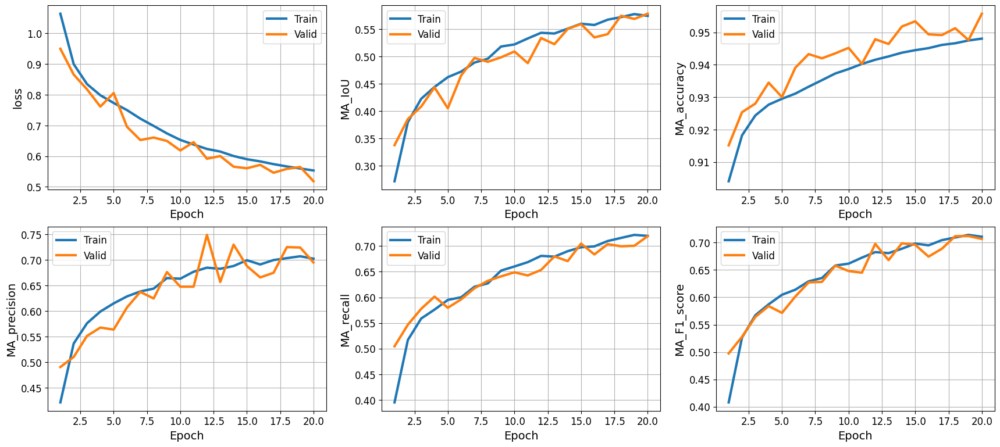

In [57]:
plot_results("checkpoint.pt", "results.csv")

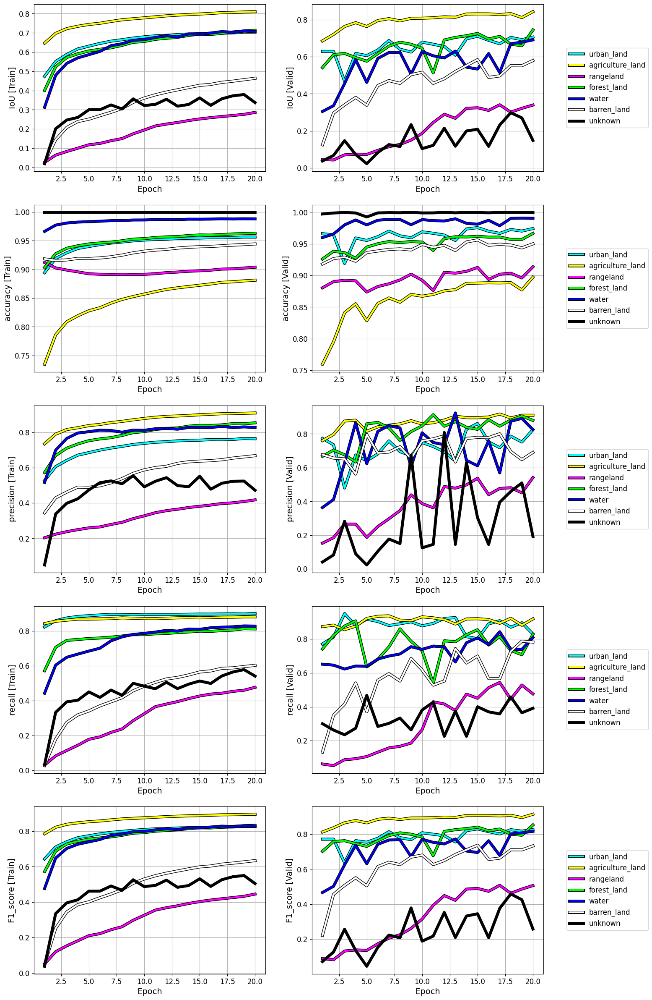

In [58]:
plot_results_per_class(class_names, class_rgb_values, "checkpoint.pt", "results.csv")

## Test model

In [59]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
if device.type == "cuda":
    # release all unoccupied cached memory
    torch.cuda.empty_cache()
    # printo GPU info
    device_count = torch.cuda.device_count()
    current_device = torch.cuda.current_device()
    device_name = torch.cuda.get_device_name(current_device)
    print("{} {} GPU available".format(str(device_count), str(device_name)))

1 Tesla T4 GPU available


In [ ]:
model_testing(model, test_iterator, criterion, device, "checkpoint.pt", "results.csv", "confusion_matrix.csv")

In [60]:
pd.read_csv("test_results.csv").iloc[:,np.arange(0, 12, 2)].style.hide_index()

loss,MA_IoU,MA_accuracy,MA_precision,MA_recall,MA_F1_score
0.428391,0.558826,0.949115,0.698898,0.693269,0.696073


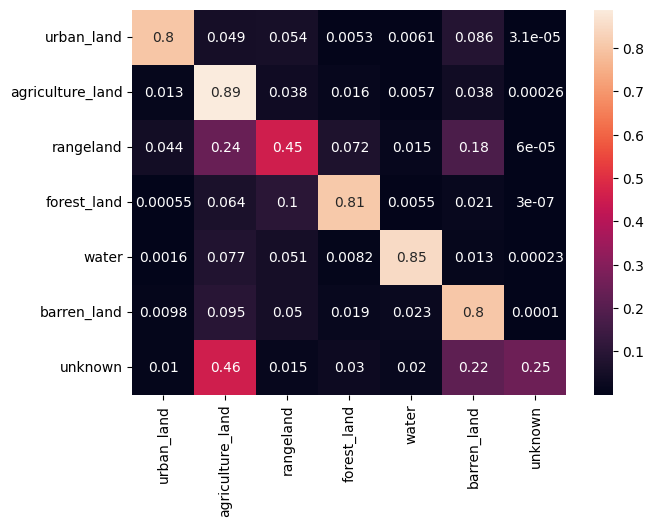

In [61]:
plot_CM(class_names, "confusion_matrix.csv")

# Resume training

## Train model

In [62]:
def load_checkpoint(model, criterion, optimizer, scheduler, checkpoint_name = "checkpoint.pt"):
    
    checkpoint = torch.load(checkpoint_name)
    model.load_state_dict(checkpoint["model_state_dict"])
    criterion.load_state_dict(checkpoint["criterion_state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
    if bool(checkpoint["scheduler_state_dict"]):
        scheduler.load_state_dict(checkpoint["scheduler_state_dict"])
        
    return model, criterion, optimizer, scheduler

In [63]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
if device.type == "cuda":
    # release all unoccupied cached memory
    torch.cuda.empty_cache()
    # printo GPU info
    device_count = torch.cuda.device_count()
    current_device = torch.cuda.current_device()
    device_name = torch.cuda.get_device_name(current_device)
    print("{} {} GPU available".format(str(device_count), str(device_name)))

1 Tesla T4 GPU available


In [ ]:
model = UNet()
model = model.to(device)

criterion = nn.CrossEntropyLoss(weight = torch.from_numpy(class_weight).float())
criterion = criterion.to(device)

optimizer = optim.Adam(model.parameters(), lr = 1e-3, weight_decay = 1e-5)

scheduler = None

# load checkpoint
model, criterion, optimizer, scheduler = load_checkpoint(model,
                                                         criterion,
                                                         optimizer,
                                                         scheduler,
                                                         checkpoint_name = "checkpoint.pt")

# resume training
N_EPOCHS = 15
train_metrics_log, valid_metrics_log = model_training(N_EPOCHS,
                                                      model,
                                                      train_iterator,
                                                      valid_iterator,
                                                      criterion,
                                                      optimizer,
                                                      scheduler,
                                                      device,
                                                      "checkpoint_1.pt",
                                                      "results_1.csv")

----------------------------------------------------------

Epoch: 1/15



Valid: 100%|██████████| 250/250 [03:00<00:00,  1.38it/s]



Train: Loss = 0.5476, MA_IoU = 58.11 %, MA_acc = 94.86 %, MA_prec = 70.95 %, MA_rec = 72.49 %, MA_F1_score = 71.71 %
Valid: Loss = 0.5129, MA_IoU = 57.09 %, MA_acc = 95.35 %, MA_prec = 69.12 %, MA_rec = 72.01 %, MA_F1_score = 70.53 %

Epoch Time: 4282.94 s

----------------------------------------------------------

Epoch: 2/15



Valid: 100%|██████████| 250/250 [03:00<00:00,  1.38it/s]



Train: Loss = 0.5428, MA_IoU = 58.11 %, MA_acc = 94.88 %, MA_prec = 71.04 %, MA_rec = 72.30 %, MA_F1_score = 71.66 %
Valid: Loss = 0.5130, MA_IoU = 56.87 %, MA_acc = 95.38 %, MA_prec = 68.11 %, MA_rec = 72.82 %, MA_F1_score = 70.39 %

Epoch Time: 4276.55 s

----------------------------------------------------------

Epoch: 3/15



Valid: 100%|██████████| 250/250 [03:00<00:00,  1.38it/s]



Train: Loss = 0.5334, MA_IoU = 58.50 %, MA_acc = 94.97 %, MA_prec = 70.93 %, MA_rec = 73.11 %, MA_F1_score = 72.00 %
Valid: Loss = 0.4809, MA_IoU = 58.59 %, MA_acc = 95.37 %, MA_prec = 70.01 %, MA_rec = 74.63 %, MA_F1_score = 72.24 %

Epoch Time: 4272.39 s

----------------------------------------------------------

Epoch: 4/15



Valid: 100%|██████████| 250/250 [03:00<00:00,  1.39it/s]



Train: Loss = 0.5284, MA_IoU = 58.33 %, MA_acc = 95.01 %, MA_prec = 70.64 %, MA_rec = 72.98 %, MA_F1_score = 71.79 %
Valid: Loss = 0.4831, MA_IoU = 58.47 %, MA_acc = 95.60 %, MA_prec = 70.23 %, MA_rec = 72.87 %, MA_F1_score = 71.53 %

Epoch Time: 4269.04 s

----------------------------------------------------------

Epoch: 5/15



Valid: 100%|██████████| 250/250 [03:00<00:00,  1.39it/s]



Train: Loss = 0.5235, MA_IoU = 59.22 %, MA_acc = 95.05 %, MA_prec = 71.95 %, MA_rec = 73.49 %, MA_F1_score = 72.72 %
Valid: Loss = 0.5104, MA_IoU = 55.98 %, MA_acc = 95.25 %, MA_prec = 68.21 %, MA_rec = 72.42 %, MA_F1_score = 70.25 %

Epoch Time: 4266.46 s

----------------------------------------------------------

Epoch: 6/15



Valid: 100%|██████████| 250/250 [03:00<00:00,  1.38it/s]



Train: Loss = 0.5173, MA_IoU = 59.30 %, MA_acc = 95.08 %, MA_prec = 71.83 %, MA_rec = 73.69 %, MA_F1_score = 72.75 %
Valid: Loss = 0.5204, MA_IoU = 56.58 %, MA_acc = 95.16 %, MA_prec = 69.72 %, MA_rec = 71.87 %, MA_F1_score = 70.78 %

Epoch Time: 4262.92 s

----------------------------------------------------------

Epoch: 7/15



Valid: 100%|██████████| 250/250 [03:00<00:00,  1.38it/s]



Train: Loss = 0.5147, MA_IoU = 59.48 %, MA_acc = 95.12 %, MA_prec = 71.82 %, MA_rec = 74.08 %, MA_F1_score = 72.93 %
Valid: Loss = 0.4896, MA_IoU = 58.24 %, MA_acc = 95.42 %, MA_prec = 70.99 %, MA_rec = 73.46 %, MA_F1_score = 72.20 %

Epoch Time: 4264.27 s

----------------------------------------------------------

Epoch: 8/15



Train:  87%|████████▋ | 1627/1875 [58:45<09:01,  2.18s/it] 

## Plot results

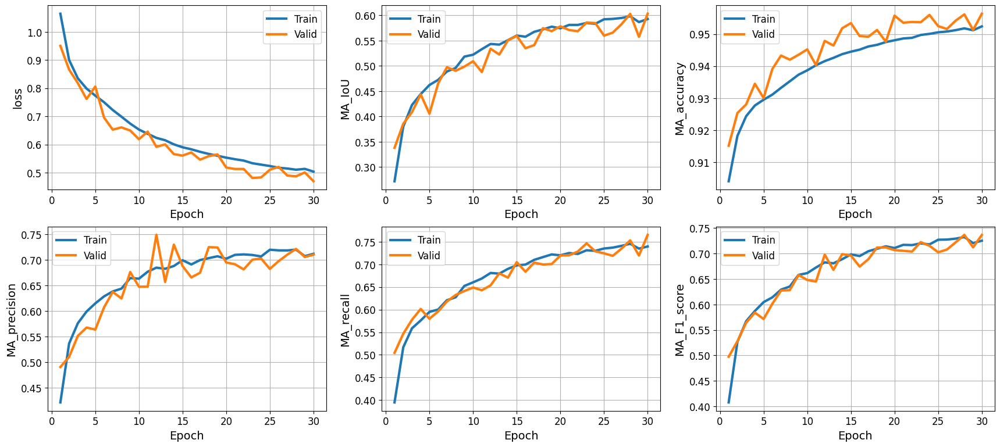

In [65]:
plot_results(["checkpoint.pt", "checkpoint_1.pt"], ["results.csv", "results_1.csv"])

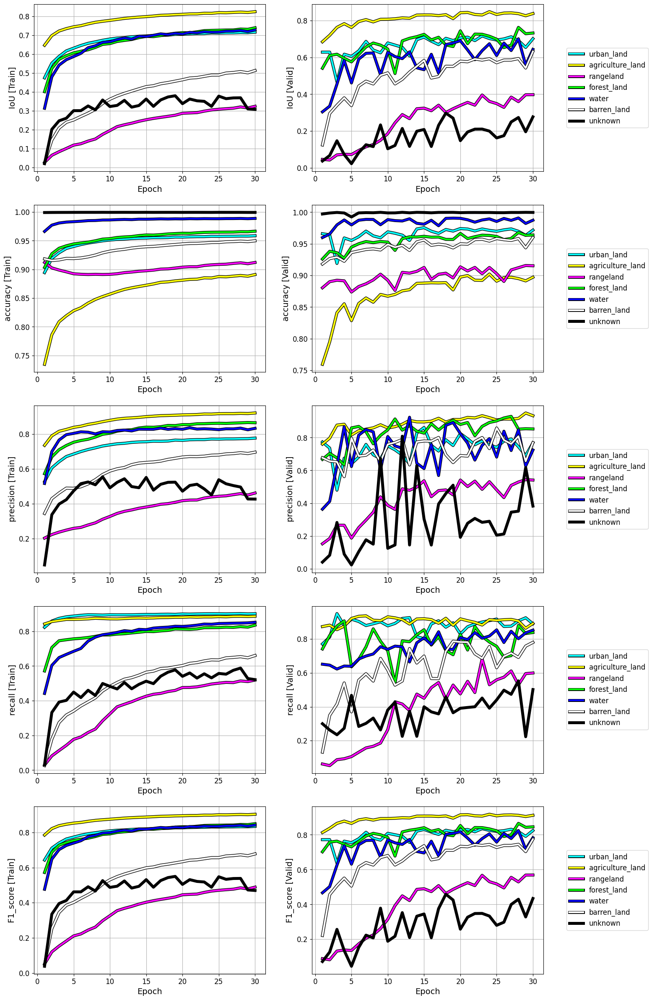

In [66]:
plot_results_per_class(class_names, class_rgb_values, ["checkpoint.pt", "checkpoint_1.pt"], ["results.csv", "results_1.csv"])

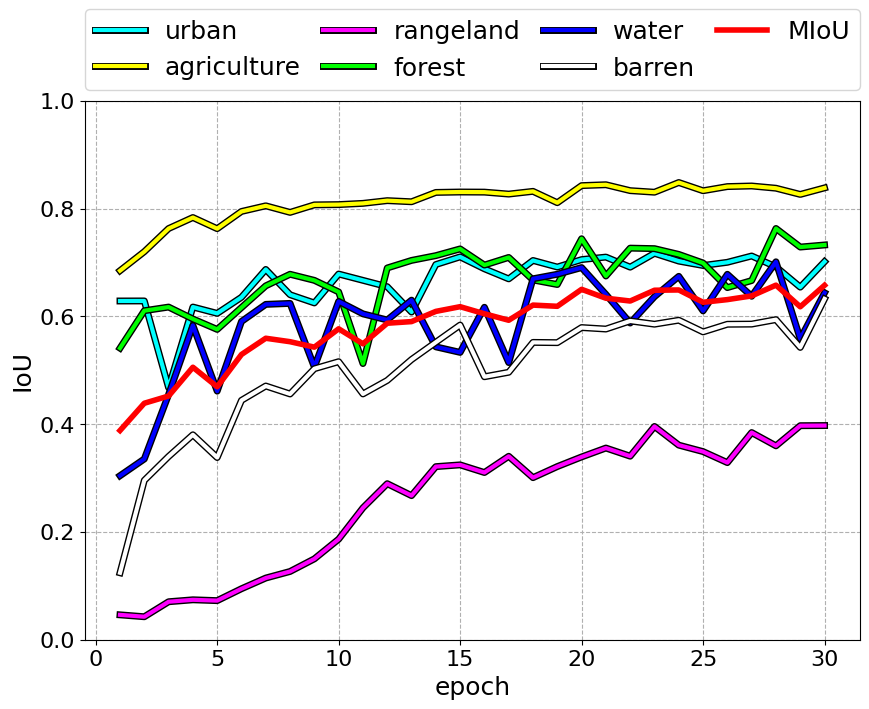

In [285]:
def plot_results_per_class_paper(class_names, class_rgb_values, checkpoint_name = "checkpoint.pt", results_name = "results.csv"):
    
    # load results into dataframes constrained by checkpoint epoch
    if not isinstance(checkpoint_name, list):
        best_epoch = torch.load(checkpoint_name)["epoch"]
        valid_results_df = pd.read_csv("valid_" + results_name).iloc[:best_epoch]
    else:
        valid_frames = []
        for i in range(len(checkpoint_name)):
            best_epoch = torch.load(checkpoint_name[i])["epoch"]
            valid_frames.append(pd.read_csv("valid_" + results_name[i]).iloc[:best_epoch]) 
        valid_results_df = pd.concat(valid_frames, ignore_index = True)
            
    n_epochs = len(valid_results_df)
    
    valid_metric = np.zeros((n_epochs, 7))
    for i in range(n_epochs):
        valid_metric[i] = np.array(json.loads(valid_results_df["IoU"].iloc[i].replace("nan", "NaN")))
     
    plt.figure(figsize = (10, 7))   
    plt.subplot(1,1,1)
    
    for i in range(6): 
        plt.plot(np.arange(n_epochs) + 1, valid_metric[:,i],
                 linewidth = 3,
                 color = np.array(class_rgb_values[i])/255,
                 label = [s.split("_")[0] for s in class_names][i],
                 path_effects = ([pe.Stroke(linewidth = 5, foreground = "black"), pe.Normal()]))
        
    plt.plot(np.arange(n_epochs) + 1, np.mean(valid_metric[:,:-1], axis = 1),
             linewidth = 4,
             linestyle = "-",
             color = "red",
             label = "MIoU")
     
    plt.xlabel("epoch", fontsize = 18)
    plt.ylabel("IoU", fontsize = 18)
    plt.xticks(fontsize = 16)
    plt.yticks(np.arange(0, 1+0.2, 0.2), fontsize = 16)
    plt.grid(ls = "--")
    
    plt.legend(bbox_to_anchor=(0, 1.02, 1, 0.2),
               loc = "lower left",
               mode = "expand",
               borderaxespad = 0,
               ncol = 4,
               fontsize = 18)
    
    #plt.subplots_adjust(right = 0.75)
    #plt.legend(bbox_to_anchor = (1.05, 0.5), loc = "center left", borderaxespad = 0, fontsize = 16)
    
    plt.savefig("./images/IoU_per_class.pdf", dpi = 1200, bbox_inches = "tight")

plot_results_per_class_paper(class_names, class_rgb_values, ["checkpoint.pt", "checkpoint_1.pt"], ["results.csv", "results_1.csv"])

## Test model

In [67]:
model_testing(model, test_iterator, criterion, device, "checkpoint_1.pt", "results_1.csv", "confusion_matrix_1.csv")

Test: 100%|██████████| 250/250 [07:10<00:00,  1.72s/it]


In [68]:
pd.read_csv("test_results_1.csv").iloc[:,np.arange(0, 12, 2)].style.hide_index()

loss,MA_IoU,MA_accuracy,MA_precision,MA_recall,MA_F1_score
0.386355,0.610811,0.953790,0.749456,0.749983,0.749719


In [303]:
pd.read_csv("test_results_1.csv")

,loss,IoU,MA_IoU,accuracy,MA_accuracy,precision,MA_precision,recall,MA_recall,F1_score,MA_F1_score
0,0.386355,"[0.734832227230072, 0.8382982611656189, 0.3289...",0.610811,"[0.9695000648498535, 0.8993822336196899, 0.906...",0.95379,"[0.8180416822433472, 0.9301708936691284, 0.497...",0.749456,"[0.878407895565033, 0.8945971727371216, 0.4923...",0.749983,"[0.8471508026123047, 0.9120372533798218, 0.495...",0.749719


In [122]:
for metric in ["IoU", "F1_score"]:
    arr = json.loads(pd.read_csv("test_results_1.csv")[metric].iloc[-1].replace("nan", "NaN"))
    arr = np.array(arr)
    print(f"MA_{metric} (6 classes):", np.mean(arr[:-1]))

MA_IoU (6 classes): 0.6451603571573893
MA_F1_score (6 classes): 0.7718376666307449


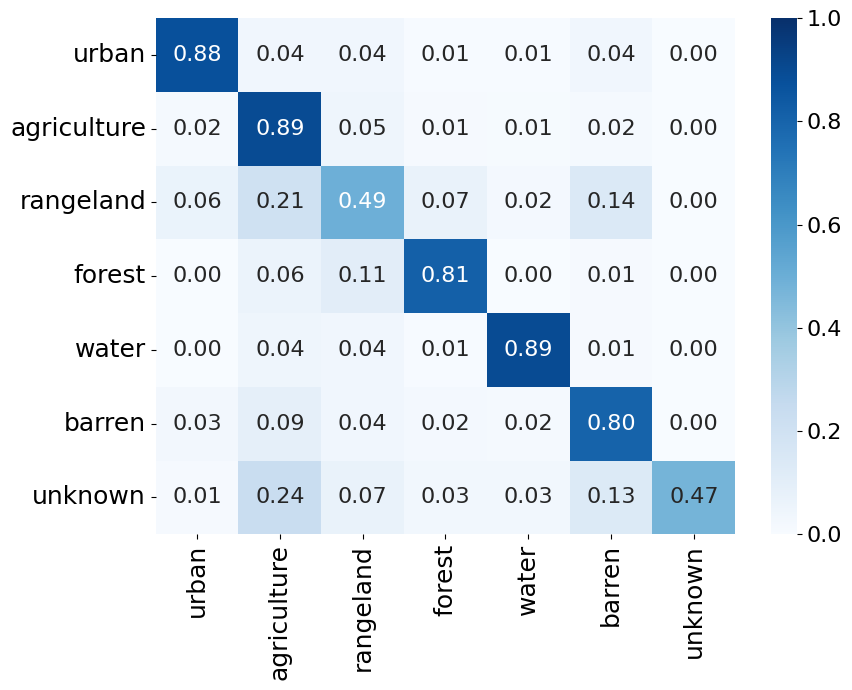

In [480]:
plot_CM(class_names, "confusion_matrix_1.csv")

# Predict

In [70]:
def predict_image(model, image, mask, CUT_IMAGE = True):
    
    # normalize
    image = (image - train_mean)/train_std

    # cut image in patches of 224 pixels, make the predictions, and put them together
    if CUT_IMAGE:
        
        patch_size = 224

        if(image.shape[0] != image.shape[1]): raise ValueError("Image should be squared")

        crop_size = patch_size*(image.shape[0]//patch_size)
        
        # central crop
        s = image.shape[1]/2 - crop_size/2
        crop_image = image[int(s):int(s+crop_size), int(s):int(s+crop_size), :]
        crop_mask = mask[int(s):int(s+crop_size), int(s):int(s+crop_size), :]

        model.to(device)

        # set evaluation mode
        model.eval()

        # disable gradient tracking
        torch.no_grad()
        
        predict_mask = np.zeros_like(crop_mask)

        for i in range(crop_image.shape[0]//patch_size):
            for j in range(crop_image.shape[0]//patch_size):

                patch = crop_image[i*patch_size:(i+1)*patch_size, j*patch_size:(j+1)*patch_size, :]

                # transform from numpy array (H,W,C) to torch tensor (C,H,W)
                patch = torch.from_numpy(patch).permute(2, 0, 1).to(device)

                # add dummy dimension for batch
                patch = patch[None, :]

                logits_mask = model(patch.float()) # (1, C, H, W)
                prob_mask = F.softmax(logits_mask, dim=1) # (1, C, H, W)
                pred_mask = prob_mask.argmax(dim=1)[0] # (H, W)
                pred_mask_rgb = dense_to_rgb_encoding(pred_mask.cpu(), class_rgb_values) # (H, W, 3)
                
                # saving patches
                predict_mask[i*patch_size:(i+1)*patch_size, j*patch_size:(j+1)*patch_size, :] = pred_mask_rgb
                        
    else:
        
        if image.shape[0]%16 != 0 : raise ValueError("Image shape should be a multiple of 16")
            
        model.to("cpu")
            
        # set evaluation mode
        model.eval()

        # disable gradient tracking
        torch.no_grad()

        # transform from numpy array (H,W,C) to torch tensor (C,H,W)
        sample = torch.from_numpy(image).permute(2, 0, 1)
        
        # add dummy dimension for batch
        sample = sample[None, :]

        logits_mask = model(sample.float()) # (1, C, H, W)
        prob_mask = F.softmax(logits_mask, dim=1) # (1, C, H, W)
        pred_mask = prob_mask.argmax(dim=1)[0] # (H, W)
        predict_mask = dense_to_rgb_encoding(pred_mask, class_rgb_values) # (H, W, 3)
    
    return predict_mask

In [582]:
def plot_prediction(model, image, mask, CUT_IMAGE = True):
    
    pred_mask = predict_image(model, image, mask, CUT_IMAGE = CUT_IMAGE)
    
    # crop to plot the same shape
    if mask.shape != pred_mask.shape:
        s = image.shape[1]/2 - pred_mask.shape[0]/2
        image = image[int(s):int(s+pred_mask.shape[0]), int(s):int(s+pred_mask.shape[0]), :]
        mask = mask[int(s):int(s+pred_mask.shape[0]), int(s):int(s+pred_mask.shape[0]), :]

    # plot image
    
    fig = plt.figure(figsize = (15, 5))
    fig.subplots_adjust(wspace = 0.02, hspace = 0.02)#, top = 0.8)
    
    idx = 1
    
    plt.subplot(1,3,idx)
    idx += 1
    plt.imshow(pred_mask)
    plt.title("Prediction", fontsize = 24, pad = 10)
    plt.xticks([])
    plt.yticks([])
    
    plt.subplot(1,3,idx)
    idx += 1
    plt.imshow(image)
    plt.title("Input image", fontsize = 24, pad = 10)
    plt.xticks([])
    plt.yticks([])

    plt.subplot(1,3,idx)
    idx += 1
    plt.imshow(mask)
    plt.title("Ground truth", fontsize = 24, pad = 10)
    plt.xticks([])
    plt.yticks([])
    
    if CUT_IMAGE:
        plt.savefig("./images/UNet_pred_patches.pdf", dpi = 600, bbox_inches = "tight")
    else:
        plt.savefig("./images/UNet_pred_full.pdf", dpi = 600, bbox_inches = "tight")
    
    plt.show()

In [505]:
metadata_df = pd.read_csv(os.path.join(DATA_PATH, "metadata.csv"))

# select only images with masks
metadata_df = metadata_df[metadata_df["split"]=="train"]

# drop "split" column
metadata_df = metadata_df[["image_id", "sat_image_path", "mask_path"]]

# modify the path of images and masks
metadata_df["sat_image_path"] = metadata_df["sat_image_path"].apply(lambda img_pth: os.path.join(DATA_PATH, img_pth))
metadata_df["mask_path"] = metadata_df["mask_path"].apply(lambda mask_pth: os.path.join(DATA_PATH, mask_pth))

metadata_df.head()

,image_id,sat_image_path,mask_path
0,100694,./data/train/100694_sat.jpg,./data/train/100694_mask.png
1,102122,./data/train/102122_sat.jpg,./data/train/102122_mask.png
2,10233,./data/train/10233_sat.jpg,./data/train/10233_mask.png
3,103665,./data/train/103665_sat.jpg,./data/train/103665_mask.png
4,103730,./data/train/103730_sat.jpg,./data/train/103730_mask.png


selected image id: 946386


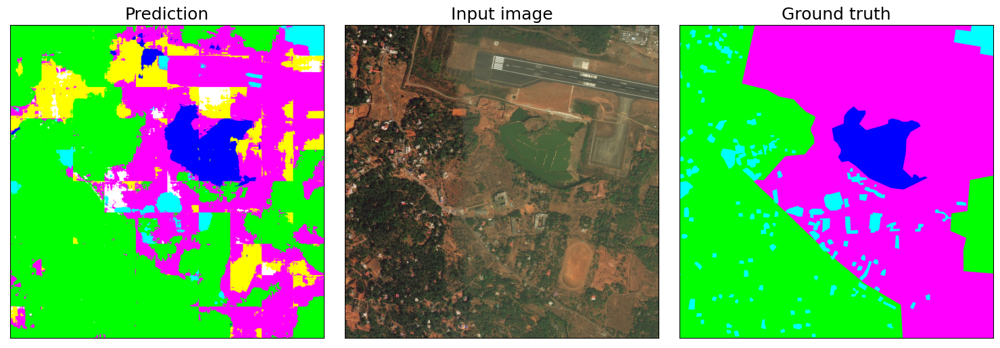

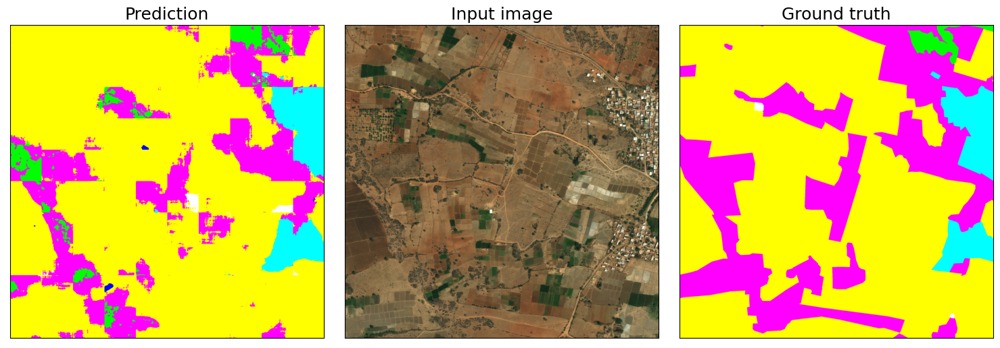

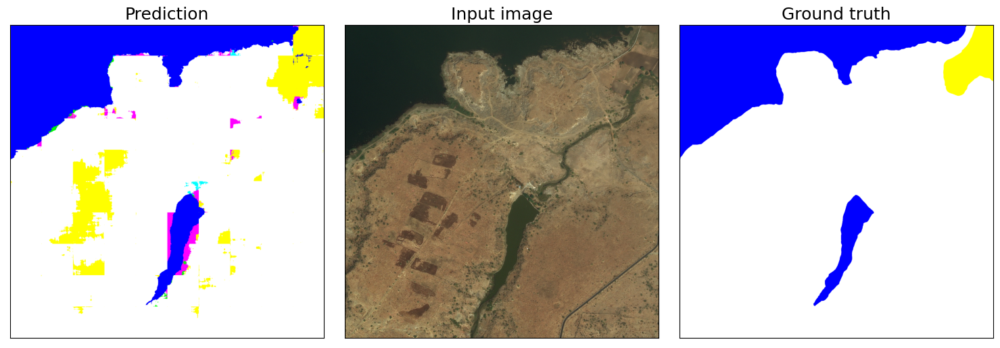

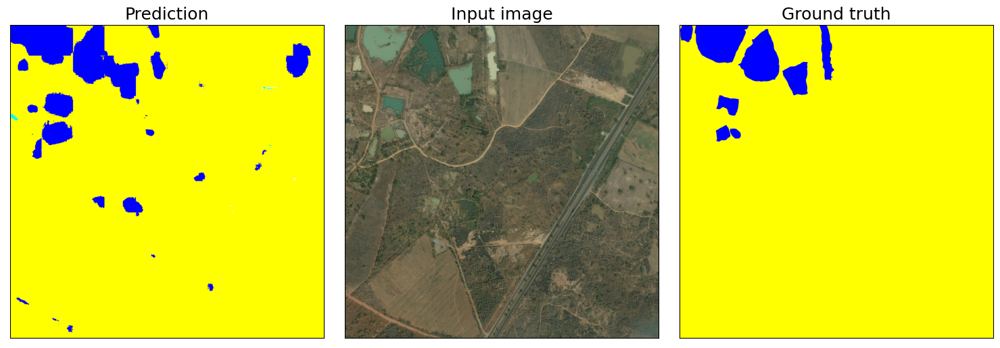

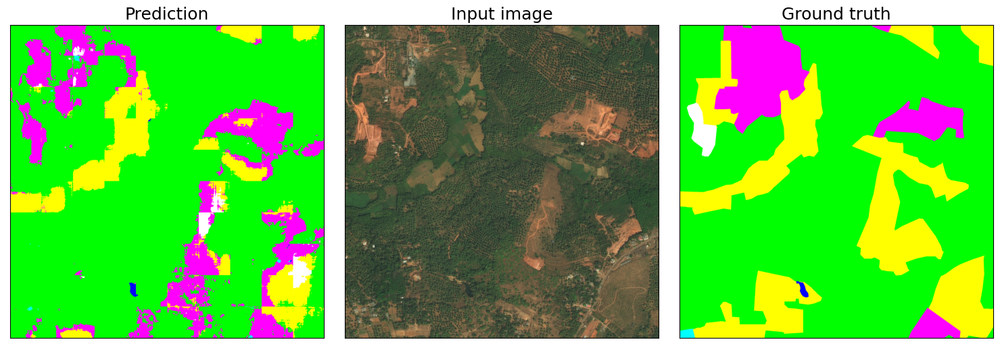

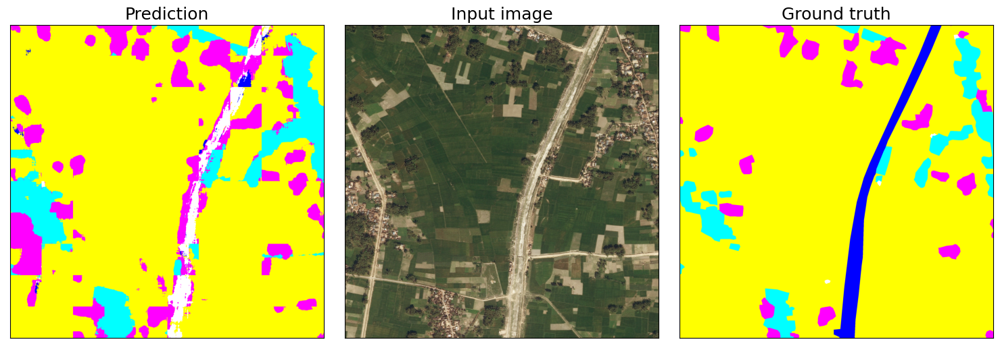

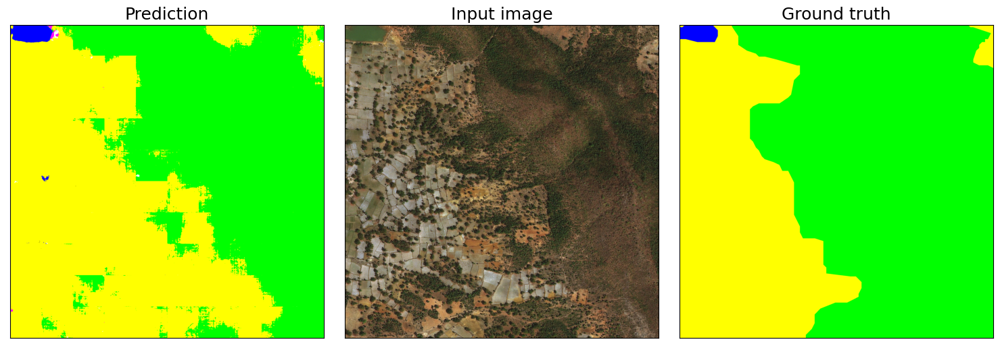

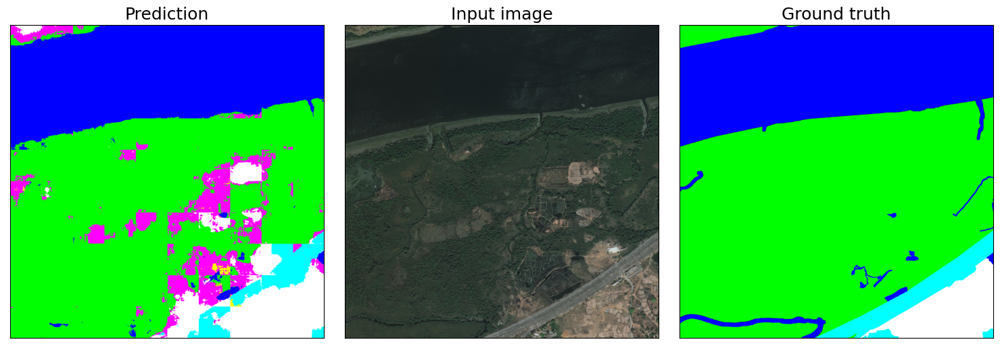

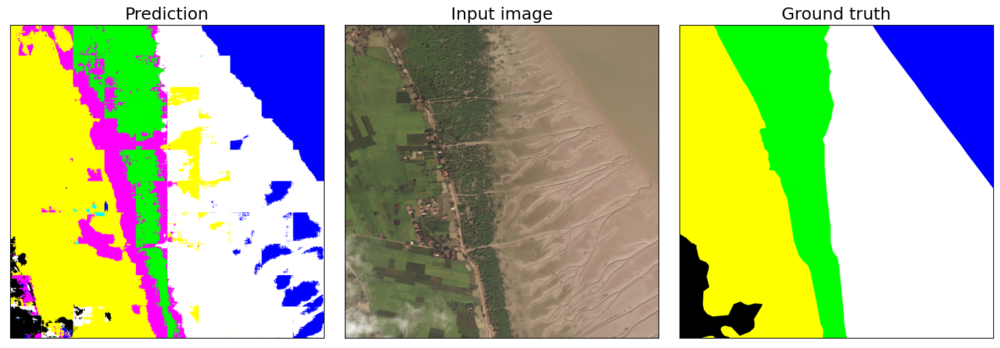

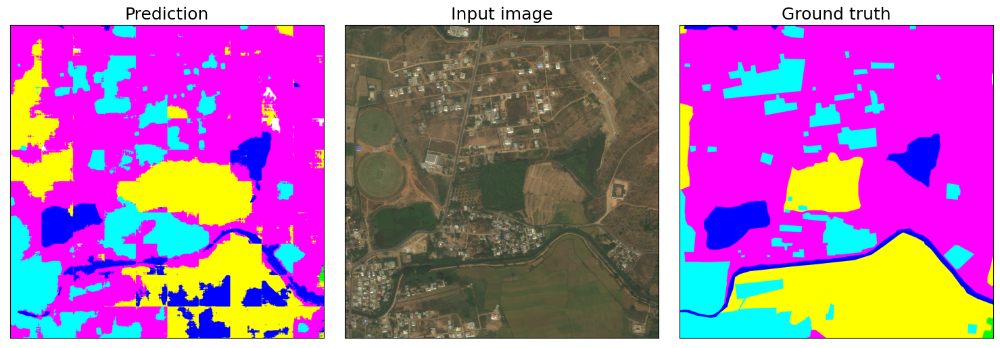

In [539]:
sample_image_id = test_df["image_id"].sample(1, ignore_index = True).iloc[0]
print("selected image id:", sample_image_id)

for sample_image_id in [713813, 208495, 186739, 53987, 897901, 942986, 632489, 882451, 454655, 172307]:

    sample_image_path = metadata_df[metadata_df["image_id"] == sample_image_id]["sat_image_path"].iloc[0]
    sample_mask_path = metadata_df[metadata_df["image_id"] == sample_image_id]["mask_path"].iloc[0]

    image = cv2.cvtColor(cv2.imread(sample_image_path),cv2.COLOR_BGR2RGB)
    mask = cv2.cvtColor(cv2.imread(sample_mask_path),cv2.COLOR_BGR2RGB)

    plot_prediction(model, image, mask, CUT_IMAGE = True)

In [583]:
sample_image_id = test_df["image_id"].sample(1, ignore_index = True).iloc[0]
print("selected image id:", sample_image_id)

sample_image_id = 186739

sample_image_path = metadata_df[metadata_df["image_id"] == sample_image_id]["sat_image_path"].iloc[0]
sample_mask_path = metadata_df[metadata_df["image_id"] == sample_image_id]["mask_path"].iloc[0]

image = cv2.cvtColor(cv2.imread(sample_image_path),cv2.COLOR_BGR2RGB)
mask = cv2.cvtColor(cv2.imread(sample_mask_path),cv2.COLOR_BGR2RGB)

plot_prediction(model, image, mask, CUT_IMAGE = False)

selected image id: 853702


RuntimeError: [enforce fail at alloc_cpu.cpp:75] err == 0. DefaultCPUAllocator: can't allocate memory: you tried to allocate 1534132224 bytes. Error code 12 (Cannot allocate memory)